In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder

# Loading Cleaned Data

In [2]:
df = pd.read_csv('../datasets/apartments_collective.csv')

# Data Processing for Machine Learning

In [3]:
df.head(50)

,Unnamed: 0,url,name/title,address,price,area,price-per-area,floor/store,no of floors/stores in the building,no of rooms,year of construction,parking space,market,form of ownership,location,latitude,longitude,distance,district
0,0,https://krakow.nieruchomosci-online.pl/mieszka...,Mieszkanie Kraków,"103171, Mistrzejowice, Kraków, małopolskie",1087000.0,74.80,14532.09,6,7,3,2016.0,True,wtórny,pełna własność,"Mistrzejowice, Kraków, województwo małopolskie...",50.097426,20.009603,6.500728,Mistrzejowice
1,1,https://krakow.nieruchomosci-online.pl/mieszka...,Mieszkanie Kraków,"2 Pułku Lotniczego, Kraków, małopolskie",550000.0,32.00,17187.50,4,8,1,2012.0,False,wtórny,pełna własność,"2, Osiedle 2 Pułku Lotniczego, Czyżyny, Kraków...",50.077806,20.012307,5.639111,Czyżyny
2,2,https://krakow.nieruchomosci-online.pl/mieszka...,Mieszkanie Kraków,"2 Pułku Lotniczego, Kraków, małopolskie",550000.0,32.30,17028.00,4,10,1,1985.0,False,wtórny,pełna własność,"2, Osiedle 2 Pułku Lotniczego, Czyżyny, Kraków...",50.077806,20.012307,5.639111,Czyżyny
3,3,https://krakow.nieruchomosci-online.pl/mieszka...,"Apartament, ul. 28 Lipca 1943","28 Lipca 1943, Wola Justowska, Kraków, małopol...",2290000.0,155.16,14758.96,0,2,5,2009.0,True,wtórny,pełna własność,"28 Lipca 1943, Wola Justowska, Zwierzyniec, Kr...",50.062710,19.872002,4.662523,Zwierzyniec
4,4,https://krakow.nieruchomosci-online.pl/mieszka...,"Mieszkanie, ul. 28 Lipca 1943","28 Lipca 1943, Wola Justowska, Kraków, małopol...",2399000.0,139.00,17258.99,1,2,3,2022.0,False,wtórny,pełna własność,"28 Lipca 1943, Wola Justowska, Zwierzyniec, Kr...",50.062710,19.872002,4.662523,Zwierzyniec
5,5,https://krakow.nieruchomosci-online.pl/mieszka...,"Apartament, ul. 28 Lipca 1943","28 Lipca 1943, Wola Justowska, Kraków, małopol...",2399000.0,146.68,16355.33,2,2,3,2002.0,True,wtórny,pełna własność,"28 Lipca 1943, Wola Justowska, Zwierzyniec, Kr...",50.062710,19.872002,4.662523,Zwierzyniec
6,6,https://www.otodom.pl/pl/oferta/nowe-mieszkani...,Nowe mieszkania na Górce Narodowej,"29 listopada - okolice, Górka Narodowa, Prądni...",778689.0,61.30,12703.00,1,5,2,2023.0,True,pierwotny,pełna własność,"Aleja 29 Listopada, Górka Narodowa, Prądnik Bi...",50.103296,19.963896,4.983478,Prądnik Biały
7,8,https://www.otodom.pl/pl/oferta/balkon-3-pokoj...,balkon + 3 pokoje + parking,"Adama Vetulaniego, Prądnik Biały, Prądnik Biał...",970000.0,55.00,17636.00,4,7,3,2023.0,True,wtórny,pełna własność,"Adama Vetulaniego, Prądnik Biały, Kraków, woje...",50.095951,19.924784,3.895335,Prądnik Biały
8,9,https://krakow.nieruchomosci-online.pl/mieszka...,"Kawalerka, ul. Agatowa","Agatowa 18, Bieżanów, Kraków, małopolskie",410000.0,28.00,14642.86,0,2,1,1997.0,False,wtórny,spółdzielcze wł. prawo do lokalu,"18, Agatowa, Złocień, Bieżanów-Prokocim, Krakó...",50.021853,20.050650,9.235760,Bieżanów-Prokocim
9,10,https://krakow.nieruchomosci-online.pl/mieszka...,"Mieszkanie, ul. Agatowa","Agatowa, Bieżanów, Kraków, małopolskie",765000.0,48.00,15937.50,3,4,3,2023.0,True,wtórny,pełna własność,"Agatowa, Osiedle Kolejowe, Złocień, Bieżanów-P...",50.022046,20.046131,8.943634,Bieżanów-Prokocim


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17932 entries, 0 to 17931
Data columns (total 19 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Unnamed: 0                           17932 non-null  int64  
 1   url                                  17932 non-null  object 
 2   name/title                           17932 non-null  object 
 3   address                              17932 non-null  object 
 4   price                                17932 non-null  float64
 5   area                                 17932 non-null  float64
 6   price-per-area                       17932 non-null  float64
 7   floor/store                          17932 non-null  int64  
 8   no of floors/stores in the building  17932 non-null  int64  
 9   no of rooms                          17932 non-null  int64  
 10  year of construction                 17932 non-null  float64
 11  parking space               

In [5]:
# Droping columns unnecessary/harmfull to model performance
# columns_to_drop = ['Unnamed: 0', 'url', 'name/title', 'address', 'location', 'latitude', 'longitude', 'price']
columns_to_drop = ['Unnamed: 0', 'url', 'name/title', 'address', 'location', 'price']

df = df.drop(columns=columns_to_drop)

In [6]:
df.head()

,area,price-per-area,floor/store,no of floors/stores in the building,no of rooms,year of construction,parking space,market,form of ownership,latitude,longitude,distance,district
0,74.80,14532.09,6,7,3,2016.0,True,wtórny,pełna własność,50.097426,20.009603,6.500728,Mistrzejowice
1,32.00,17187.50,4,8,1,2012.0,False,wtórny,pełna własność,50.077806,20.012307,5.639111,Czyżyny
2,32.30,17028.00,4,10,1,1985.0,False,wtórny,pełna własność,50.077806,20.012307,5.639111,Czyżyny
3,155.16,14758.96,0,2,5,2009.0,True,wtórny,pełna własność,50.062710,19.872002,4.662523,Zwierzyniec
4,139.00,17258.99,1,2,3,2022.0,False,wtórny,pełna własność,50.062710,19.872002,4.662523,Zwierzyniec


# Verifying Data Cleaning Process / Adapting data to model

## Missing Data

In [7]:
df.isnull().sum()

area                                   0
price-per-area                         0
floor/store                            0
no of floors/stores in the building    0
no of rooms                            0
year of construction                   0
parking space                          0
market                                 0
form of ownership                      0
latitude                               0
longitude                              0
distance                               0
district                               0
dtype: int64

## Outliers handling

In [8]:
df.describe().round(2)

,area,price-per-area,floor/store,no of floors/stores in the building,no of rooms,year of construction,latitude,longitude,distance
count,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00
mean,56.99,16813.15,2.35,4.79,2.59,2003.31,50.06,19.95,4.37
std,28.14,4701.30,2.12,2.41,1.06,35.30,0.03,0.05,2.50
min,10.27,19.14,-1.00,1.00,1.00,1300.00,49.98,19.80,0.04
25%,39.50,14000.00,1.00,3.00,2.00,2000.00,50.04,19.92,2.46
50%,51.01,16200.00,2.00,4.00,2.00,2018.00,50.06,19.95,3.99
75%,66.00,18611.03,3.00,6.00,3.00,2023.00,50.08,19.98,6.11
max,550.00,152594.09,15.00,18.00,44.00,2026.00,50.12,20.20,18.93


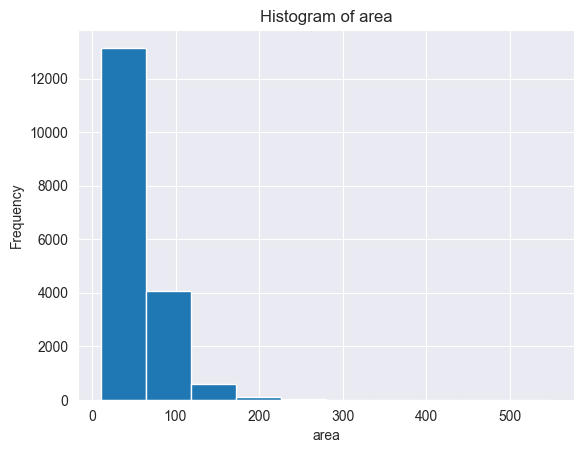

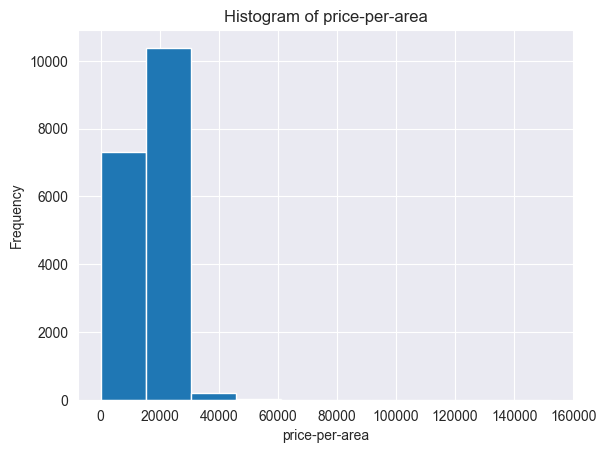

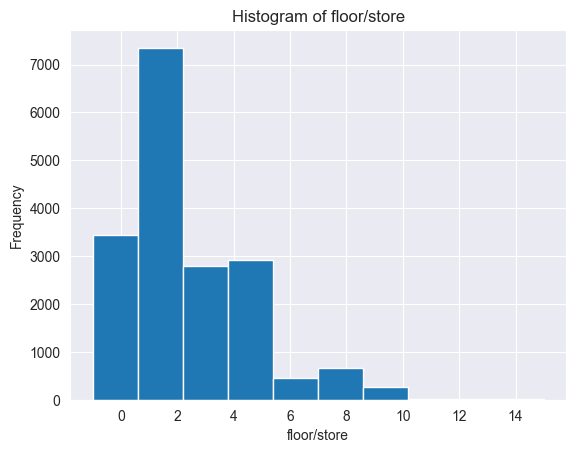

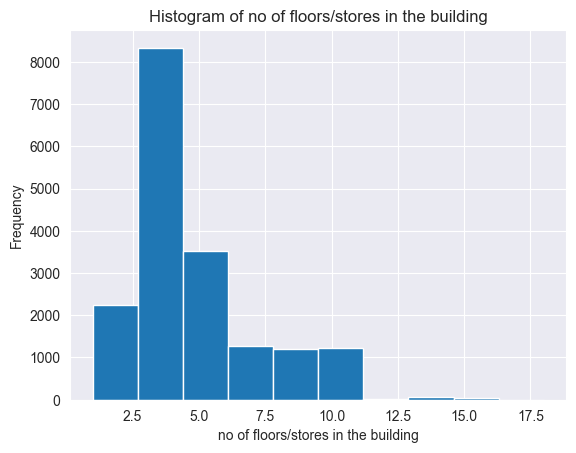

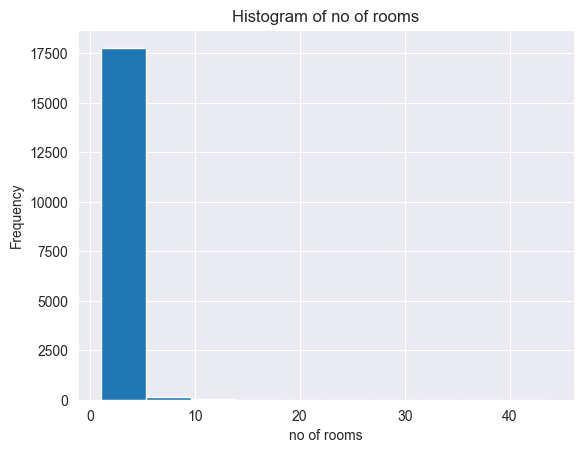

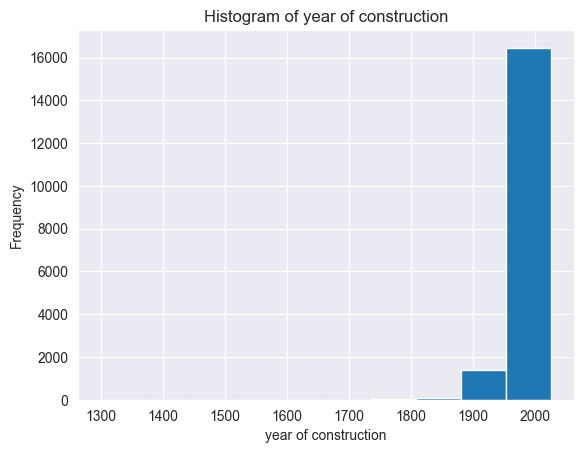

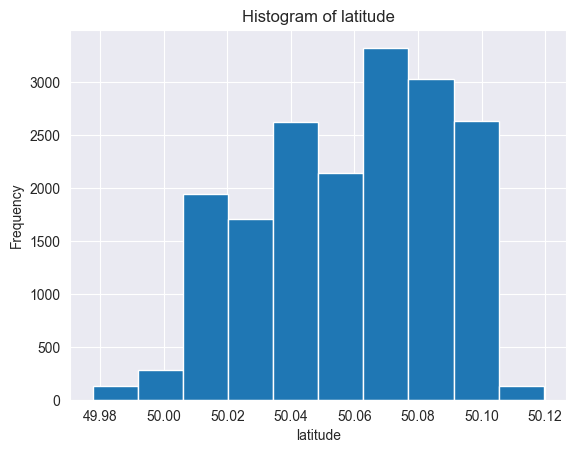

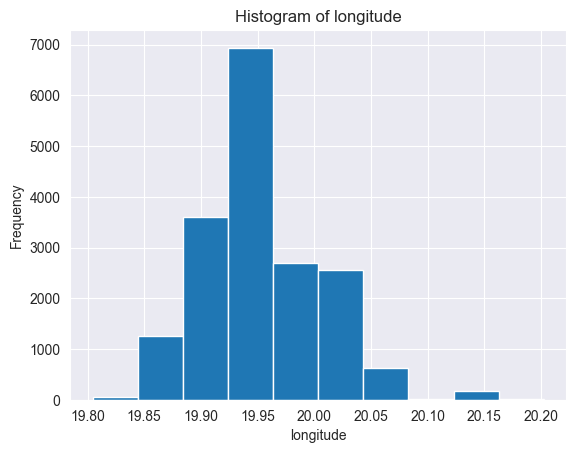

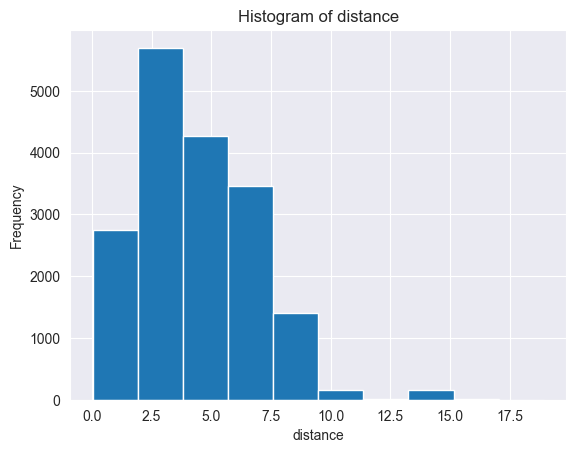

In [9]:
for column in df.select_dtypes(include=['number']).columns:
    plt.figure()
    df[column].plot(kind='hist', bins=10, title=f'Histogram of {column}')
    plt.xlabel(column)
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

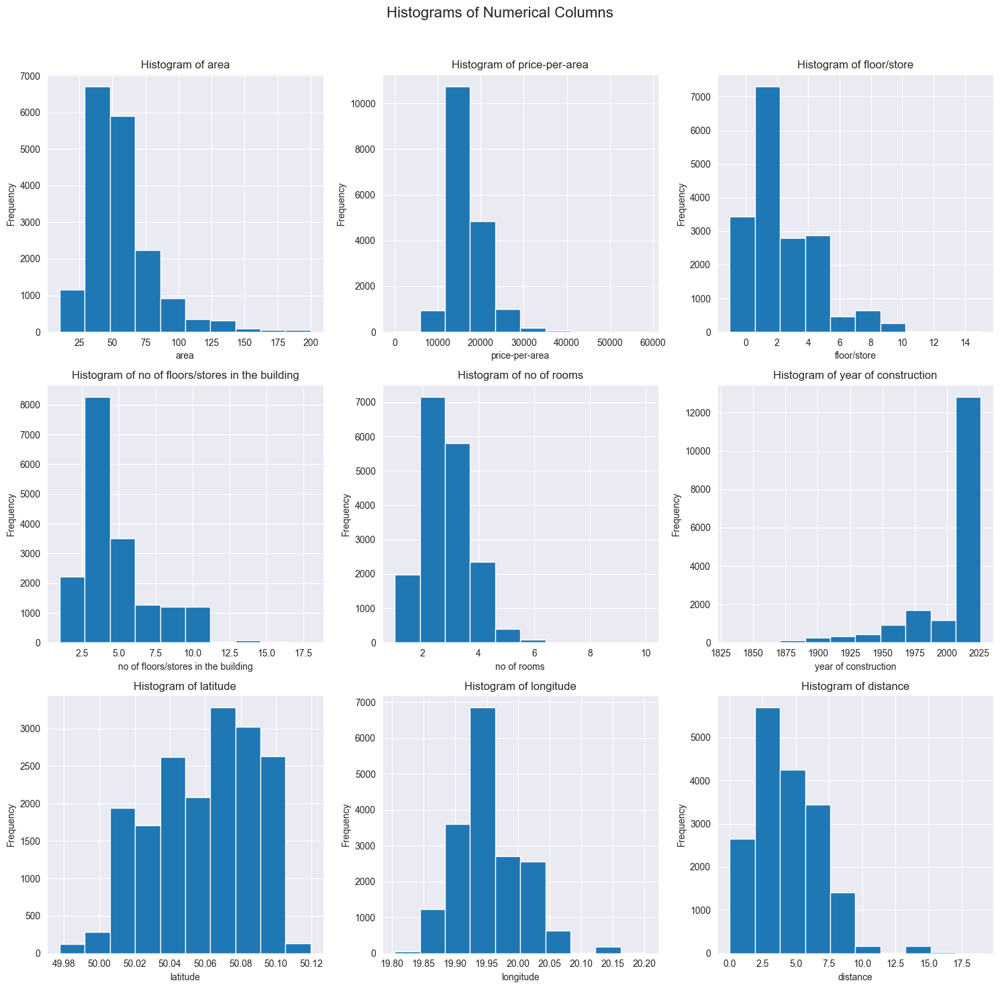

In [60]:
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle('Histograms of Numerical Columns', fontsize=16)

numerical_columns = df.select_dtypes(include=['number']).columns

for ax, column in zip(axes.flatten(), numerical_columns):
    df[column].plot(kind='hist', bins=10, ax=ax, title=f'Histogram of {column}')
    ax.set_xlabel(column)
    ax.set_ylabel('Frequency')
    ax.grid(True)

for ax in axes.flatten()[len(numerical_columns):]:
    fig.delaxes(ax)

plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('histograms.png')
plt.show()

In [10]:
df.describe().round(2)

,area,price-per-area,floor/store,no of floors/stores in the building,no of rooms,year of construction,latitude,longitude,distance
count,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00,17932.00
mean,56.99,16813.15,2.35,4.79,2.59,2003.31,50.06,19.95,4.37
std,28.14,4701.30,2.12,2.41,1.06,35.30,0.03,0.05,2.50
min,10.27,19.14,-1.00,1.00,1.00,1300.00,49.98,19.80,0.04
25%,39.50,14000.00,1.00,3.00,2.00,2000.00,50.04,19.92,2.46
50%,51.01,16200.00,2.00,4.00,2.00,2018.00,50.06,19.95,3.99
75%,66.00,18611.03,3.00,6.00,3.00,2023.00,50.08,19.98,6.11
max,550.00,152594.09,15.00,18.00,44.00,2026.00,50.12,20.20,18.93


In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17932 entries, 0 to 17931
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   area                                 17932 non-null  float64
 1   price-per-area                       17932 non-null  float64
 2   floor/store                          17932 non-null  int64  
 3   no of floors/stores in the building  17932 non-null  int64  
 4   no of rooms                          17932 non-null  int64  
 5   year of construction                 17932 non-null  float64
 6   parking space                        17932 non-null  bool   
 7   market                               17932 non-null  object 
 8   form of ownership                    17932 non-null  object 
 9   latitude                             17932 non-null  float64
 10  longitude                            17932 non-null  float64
 11  distance                    

In [12]:
condition1 = df['area'] > 200
condition2 = df['price-per-area'] > 60000
condition3 = df['no of rooms'] > 10
condition4 = (df['year of construction'] <= 1800)

outlier_conditions = condition1 | condition2 | condition3 | condition4

outlier_count = df[outlier_conditions].shape[0]
print("Number of outliers:", outlier_count)

Number of outliers: 117


In [13]:
df.shape

(17932, 13)

In [14]:
# Removing Outliers (approximately 0.65%)
df = df[~outlier_conditions]

In [15]:
df.shape

(17815, 13)

In [16]:
# for column in df.select_dtypes(include=['number']).columns:
#     plt.figure()
#     df[column].plot(kind='hist', bins=10, title=f'Histogram of {column}')
#     plt.xlabel(column)
#     plt.ylabel('Frequency')
#     plt.grid(True)
#     plt.show()

In [17]:
# df.describe().round(2)

# One Hot Encoding

In [18]:
# encoder = OneHotEncoder()
# 
categorical_columns = ['market', 'form of ownership', 'district']
# categorical_data = df[categorical_columns]
# 
# 
# encoded_data = encoder.fit_transform(categorical_data)
# encoded_df = pd.DataFrame(encoded_data.toarray(), columns=encoder.get_feature_names_out())
# 
# df.drop(columns=categorical_columns, inplace=True)
# df_encoded = pd.concat([df, encoded_df], axis=1)

df_encoded = pd.get_dummies(df, columns=categorical_columns, drop_first=False)

In [19]:
df_encoded.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17815 entries, 0 to 17931
Data columns (total 34 columns):
 #   Column                                               Non-Null Count  Dtype  
---  ------                                               --------------  -----  
 0   area                                                 17815 non-null  float64
 1   price-per-area                                       17815 non-null  float64
 2   floor/store                                          17815 non-null  int64  
 3   no of floors/stores in the building                  17815 non-null  int64  
 4   no of rooms                                          17815 non-null  int64  
 5   year of construction                                 17815 non-null  float64
 6   parking space                                        17815 non-null  bool   
 7   latitude                                             17815 non-null  float64
 8   longitude                                            17815 non-null  fl

In [20]:
df_encoded.to_csv('model_data.csv', index=False)

print("Data has been successfully saved to 'model_data.csv'.")

Data has been successfully saved to 'model_data.csv'.


# Train/Test split

In [21]:
X = df_encoded.drop('price-per-area', axis=1)
y = df_encoded['price-per-area']

In [22]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42)

print(f'Training set size: X_train: {X_train.shape}, y_train: {y_train.shape}')
print(f'Testing set size: X_test: {X_test.shape}, y_test: {y_test.shape}')

Training set size: X_train: (14252, 33), y_train: (14252,)
Testing set size: X_test: (3563, 33), y_test: (3563,)


# Experiments Result - TESTS

In [23]:
import torch
print(torch.cuda.device_count())
print(torch.cuda.get_device_name(0))

1
NVIDIA GeForce GTX 1060 6GB


In [24]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

if device.type == 'cuda':
    print('Code is being executed using CUDA [GPU] - OK!\n'f'Using GPU Device: {torch.cuda.get_device_name(device)}')
else:
    print('Code is being executed using CPU - SLOW!')

Code is being executed using CUDA [GPU] - OK!
Using GPU Device: NVIDIA GeForce GTX 1060 6GB


In [25]:
import pandas as pd
from sklearn.linear_model import Lasso
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from lightgbm import LGBMRegressor
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier, CatBoostRegressor


In [26]:
MODELS_DICT = {
    'Lasso': Lasso(),
    'DT': DecisionTreeRegressor(),
    'RF': RandomForestRegressor(),
    'SVR': SVR(),
    'LGB': LGBMRegressor(device='gpu'),
    'GBM': GradientBoostingRegressor(),
    'XGB': XGBRegressor(tree_method='hist',device='cuda'),
    'CBR': CatBoostRegressor(task_type='GPU')
}

MODELS_PARAMS = {
    'Lasso': [
        {
            'regressor_model__random_state': Categorical([0]),
            'regressor_model__alpha': Real(1e-4, 1.0, prior='log-uniform')
        }],
    'DT': [
        {
            'regressor_model__random_state': Categorical([0]),
            'regressor_model__max_depth': Integer(3, 17),
            'regressor_model__min_samples_leaf': Integer(10, 100),
            'regressor_model__min_samples_split': Integer(2, 50),
            'regressor_model__max_features': Categorical(['sqrt', 'log2', None]),
        }
    ],
    'RF': [
        {
            'regressor_model__random_state': Categorical([0]),
            'regressor_model__n_estimators': Integer(200, 1500),
            'regressor_model__max_depth': Integer(3, 17),
            'regressor_model__min_samples_leaf': Integer(10, 50),
            'regressor_model__min_samples_split': Integer(3, 20),
            'regressor_model__max_features': Categorical(['sqrt', 'log2', None])
        }
    ],
    'GBM': [
        {
            'regressor_model__random_state': Categorical([0]),
            'regressor_model__n_estimators': Integer(2000, 6000),
            'regressor_model__learning_rate': Real(0.01, 0.05),
            'regressor_model__max_depth': Integer(2, 6),
            'regressor_model__max_features': Categorical(['sqrt']),
            'regressor_model__min_samples_leaf': Integer(10, 20),
            'regressor_model__min_samples_split': Integer(10, 20),
            'regressor_model__loss': Categorical(['huber'])
        }
    ],
    'LGB': [
        {
            'regressor_model__random_state': Categorical([0]),
            'regressor_model__num_leaves': Integer(5, 20),
            'regressor_model__n_estimators': Integer(2000, 6000),
            'regressor_model__learning_rate': Real(1e-2, 1e-1),
            'regressor_model__verbose': Integer(-10, 10),
            'regressor_model__max_bin': Integer(50, 250),
            'regressor_model__bagging_fraction': Real(0.1, 1),
            'regressor_model__bagging_freq': Integer(2, 10),
            'regressor_model__bagging_seed': Integer(1, 10),
            'regressor_model__feature_fraction': Real(0.1, 1),
            'regressor_model__feature_fraction_seed': Integer(1, 10),
            'regressor_model__objective': Categorical(['regression'])
        }],
    'XGB': [
        {
            'regressor_model__random_state': Categorical([0]),
            'regressor_model__n_estimators': Integer(2000, 6000),
            'regressor_model__learning_rate': Real(0.01, 0.05),
            'regressor_model__max_depth': Integer(2, 6),
            'regressor_model__min_child_weight': Real(0, 0.5),
            'regressor_model__subsample': Real(0.5, 1.0, prior='uniform'),
            'regressor_model__reg_alpha': Real(0.01, 1),
            'regressor_model__reg_lambda': Real(0, 1),
            'regressor_model__gamma': Real(0, 0.05),
            'regressor_model__colsample_bytree': Real(0.2, 1),
            'regressor_model__nthread': Categorical([-1])
        },
    ],
    'CBR': [
        {
            'regressor_model__iterations': Integer(500, 2000),
            'regressor_model__learning_rate': Real(0.01, 0.3),
            'regressor_model__depth': Integer(4, 10),
            'regressor_model__l2_leaf_reg': Real(1, 10),
            'regressor_model__random_strength': Real(1e-9, 10),
            'regressor_model__bagging_temperature': Real(0.0, 1.0),
            'regressor_model__border_count': Integer(32, 255),
            'regressor_model__verbose': Categorical([False])
        }
    ]
}

In [27]:
def run_experiments(model_names_list, n_iter):
    print('Loading models...')
    model_dict = {}

    dataset = 'model_data.csv'
    try:
        df = pd.read_csv(dataset)
        x = df.drop('price-per-area', axis=1)
        y = df['price-per-area']

        x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

        for model_name in model_names_list.split(','):
            assert model_name in MODELS_DICT.keys(), f'Unknown model_name: {model_name}'
            model = MODELS_DICT[model_name]
            model_dict[model_name] = model

        for model_name, model in model_dict.items():
            print(f'Running experiments for {model_name}')
            pipe = Pipeline([('scaler', StandardScaler()), ('regressor_model', model)])
            opt = BayesSearchCV(
                pipe,
                MODELS_PARAMS[model_name],
                n_iter=n_iter,
                random_state=7,
                verbose=True
            )
            opt.fit(x_train, y_train)

            best_score = opt.score(x_test, y_test)
            best_params = opt.best_params_

            result_df = pd.DataFrame([{**{'Model': model_name, 'Score': best_score}, **best_params}])
            result_df.to_csv(f'reports/model_results_{model_name}.csv', index=False)

    except Exception as e:
        print(f'An error occurred: {e}')

In [28]:
#TODO różne proporcje train/test, with/without outliers, different variance of iterations

In [29]:
run_experiments('DT,RF,LGB,GBM,XGB,CBR', 30)

# Linear Regression - as a starting point

In [30]:
from sklearn.linear_model import LinearRegression
df_encoded = pd.read_csv('model_data.csv')

X = df_encoded.drop('price-per-area', axis=1)
y = df_encoded['price-per-area']

In [31]:
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)

LinearRegression()

In [32]:
lr_predictions = lr_model.predict(X_test)

In [33]:
from model_evaluation import *
lr_rmse = root_mean_squared_error(y_test, lr_predictions)
lr_r2 = r2_score(y_test, lr_predictions)
lr_mae = mean_absolute_error(y_test, lr_predictions)

print(f'Root Mean Squared Error: {lr_rmse}')
print(f'R-squared: {lr_r2}')
print(f'Mean Absolute Error: {lr_mae}')

Root Mean Squared Error: 3164.8226007729522
R-squared: 0.4360668953791488
Mean Absolute Error: 2131.237037350902


### Building other models

In [34]:
params_files = {
    # 'CBR': 'reports/model_results_CBR.csv',
    'DT': 'reports/model_results_DT.csv',
    'GBM': 'reports/model_results_GBM.csv',
    'LGB': 'reports/model_results_LGB.csv',
    'RF': 'reports/model_results_RF.csv',
    'XGB': 'reports/model_results_XGB.csv'
}


def convert_param_types(params):
    for key, value in params.items():
        if pd.isna(value):
            params[key] = None
        elif isinstance(value, float) and value.is_integer():
            params[key] = int(value)
        else:
            if key in ['max_depth', 'min_samples_split', 'min_samples_leaf', 'n_estimators', 'num_leaves', 'max_bin', 'bagging_freq', 'feature_fraction_seed', 'bagging_seed', 'border_count', 'random_state']:
                params[key] = int(value)
            elif key in ['learning_rate', 'subsample', 'colsample_bytree', 'reg_alpha', 'reg_lambda', 'gamma', 'l2_leaf_reg', 'random_strength', 'bagging_temperature']:
                params[key] = float(value)
    return params

params_dict = {}
for model, file in params_files.items():
    params_df = pd.read_csv(file)
    params_df = params_df.drop(columns=['Score', 'Model'])
    params_df = params_df.rename(columns=lambda x: x.replace('regressor_model__', ''))
    params_dict[model] = convert_param_types(params_df.iloc[0].to_dict())

In [35]:
def map_catboost_params(params):
    param_mapping = {
        'iterations': 'iterations',
        'learning_rate': 'learning_rate',
        'depth': 'depth',
        'l2_leaf_reg': 'l2_leaf_reg',
        'random_strength': 'random_strength', 
        'bagging_temperature': 'bagging_temperature',
        'border_count': 'border_count',
        'verbose': 'verbose'
    }
    return {param_mapping.get(k, k): v for k, v in params.items()}


In [36]:
def fit_model(model_name, X_train, y_train, params_dict):
    model = MODELS_DICT[model_name]
    params = params_dict[model_name]
    model.set_params(**params)
    model.fit(X_train, y_train)
    return model

trained_models = {}
trained_models["LR"] = lr_model

for model_name in params_dict.keys():
    model = fit_model(model_name, X_train, y_train, params_dict)
    trained_models[model_name] = model
    print(f"{model_name} model trained with params: {params_dict[model_name]}")

DT model trained with params: {'max_depth': 17, 'max_features': None, 'min_samples_leaf': 10, 'min_samples_split': 2, 'random_state': 0}
GBM model trained with params: {'learning_rate': 0.05, 'loss': 'huber', 'max_depth': 6, 'max_features': 'sqrt', 'min_samples_leaf': 10, 'min_samples_split': 20, 'n_estimators': 6000, 'random_state': 0}
LGB model trained with params: {'bagging_fraction': 1, 'bagging_freq': 7, 'bagging_seed': 1, 'feature_fraction': 0.5261563195471598, 'feature_fraction_seed': 5, 'learning_rate': 0.0839746105491496, 'max_bin': 250, 'n_estimators': 6000, 'num_leaves': 20, 'objective': 'regression', 'random_state': 0, 'verbose': -10}
RF model trained with params: {'max_depth': 17, 'max_features': None, 'min_samples_leaf': 10, 'min_samples_split': 15, 'n_estimators': 1203, 'random_state': 0}
XGB model trained with params: {'colsample_bytree': 0.4821046184484189, 'gamma': 0.026926851367565, 'learning_rate': 0.0483551604254158, 'max_depth': 6, 'min_child_weight': 0.2897300023

In [37]:
catboost_params = {
    'iterations': 2000,
    'learning_rate': 0.26014881642562837,
    'depth': 10,
    'l2_leaf_reg': 8.48173900417312,
    'random_strength': 10,
    'bagging_temperature': 0.861146049577924,
    'border_count': 181,
    'verbose': False,
    'task_type': 'GPU'
}

catboost_model = CatBoostRegressor(**catboost_params)
catboost_model.fit(X_train, y_train)
trained_models["CBR"] = catboost_model

In [38]:
trained_models

{'LR': LinearRegression(),
 'DT': DecisionTreeRegressor(max_depth=17, min_samples_leaf=10, random_state=0),
 'GBM': GradientBoostingRegressor(learning_rate=0.05, loss='huber', max_depth=6,
                           max_features='sqrt', min_samples_leaf=10,
                           min_samples_split=20, n_estimators=6000,
                           random_state=0),
 'LGB': LGBMRegressor(bagging_fraction=1, bagging_freq=7, bagging_seed=1, device='gpu',
               feature_fraction=0.5261563195471598, feature_fraction_seed=5,
               learning_rate=0.0839746105491496, max_bin=250, n_estimators=6000,
               num_leaves=20, objective='regression', random_state=0,
               verbose=-10),
 'RF': RandomForestRegressor(max_depth=17, max_features=None, min_samples_leaf=10,
                       min_samples_split=15, n_estimators=1203, random_state=0),
 'XGB': XGBRegressor(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynod

In [39]:
from math import sqrt

def calculate_percentage_measure(y_true, y_pred, percentage):
    abs_percent_error = np.abs((y_true - y_pred) / y_true) * 100
    within_range = np.sum(abs_percent_error <= percentage) / len(y_true)
    return within_range

C:\Users\Piotr\AppData\Local\Temp\ipykernel_9616\565074468.py:30: FutureWarning:

The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.



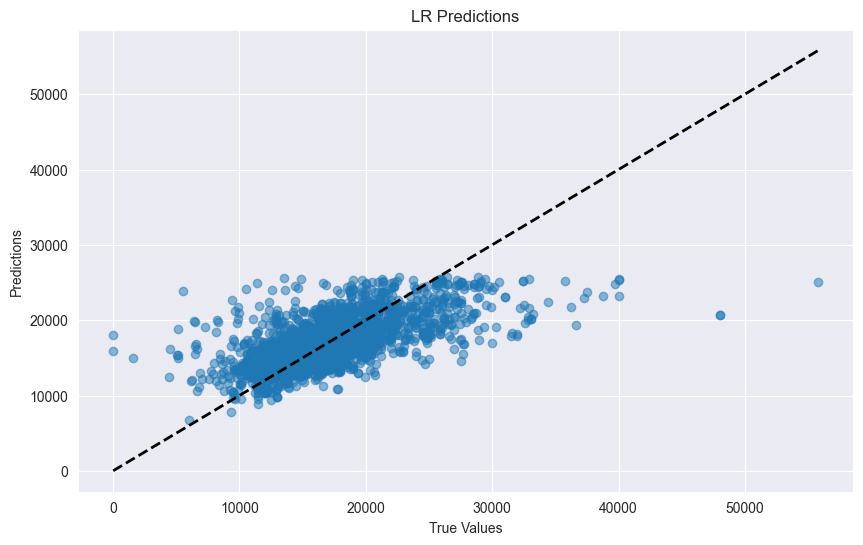

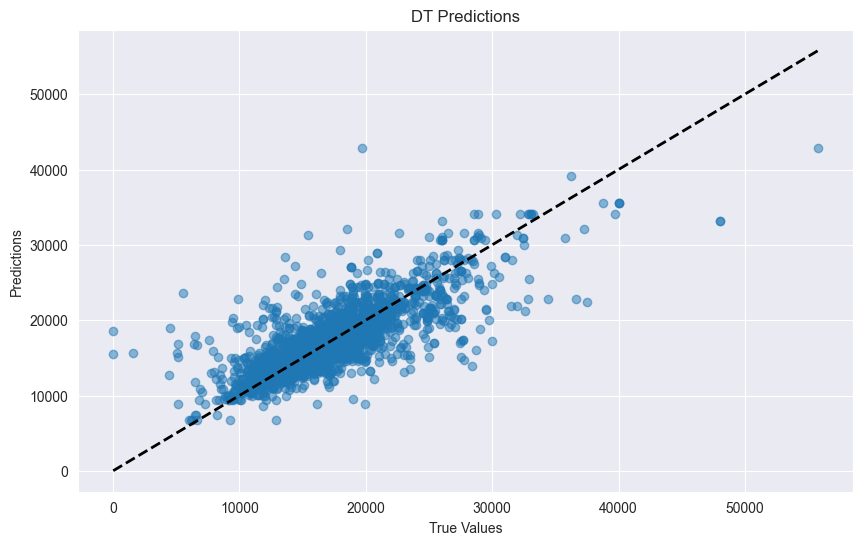

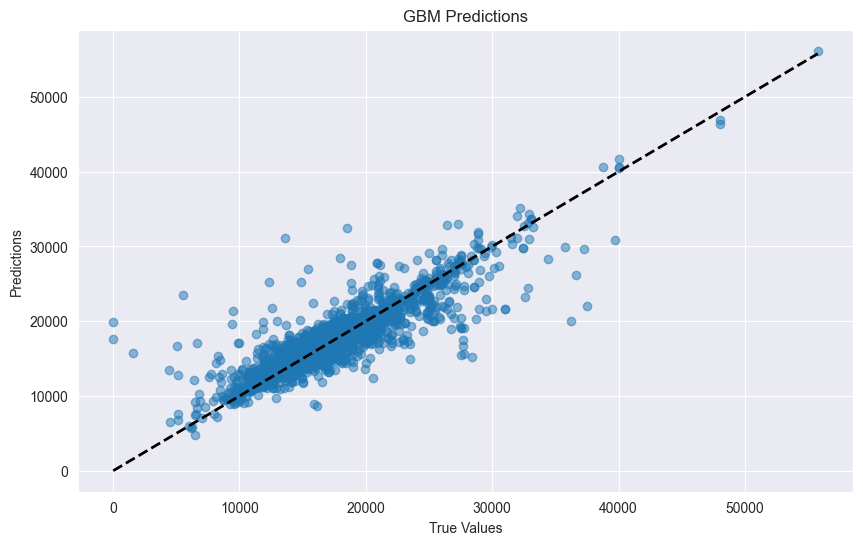

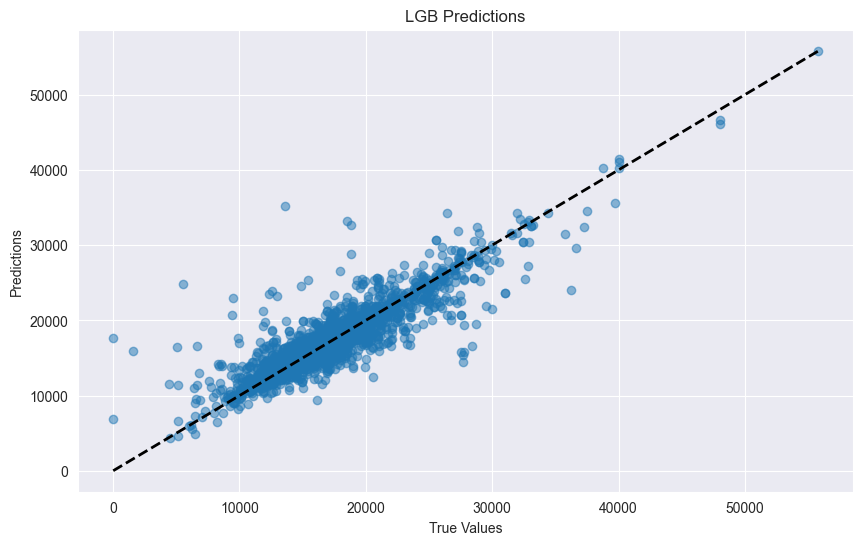

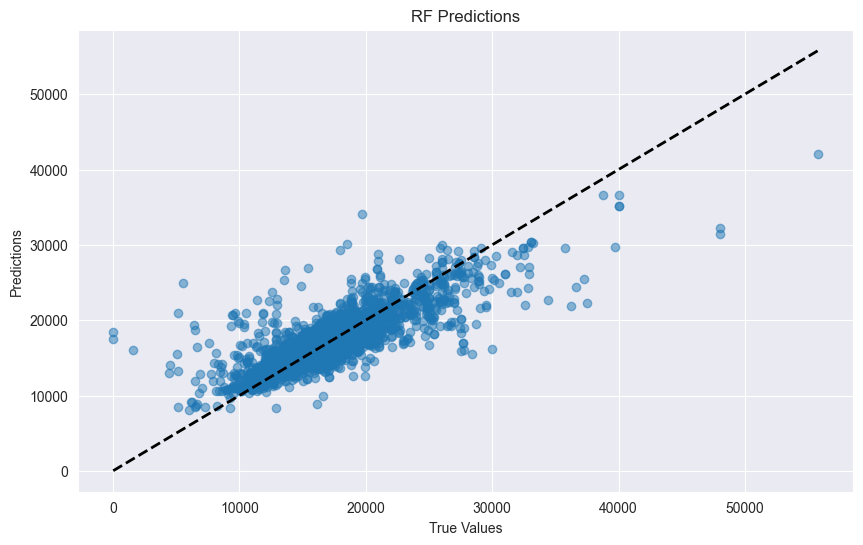

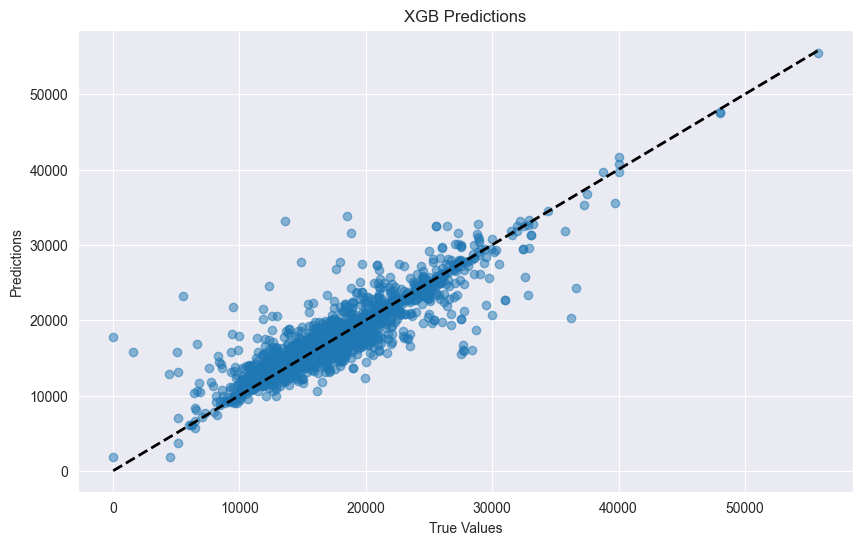

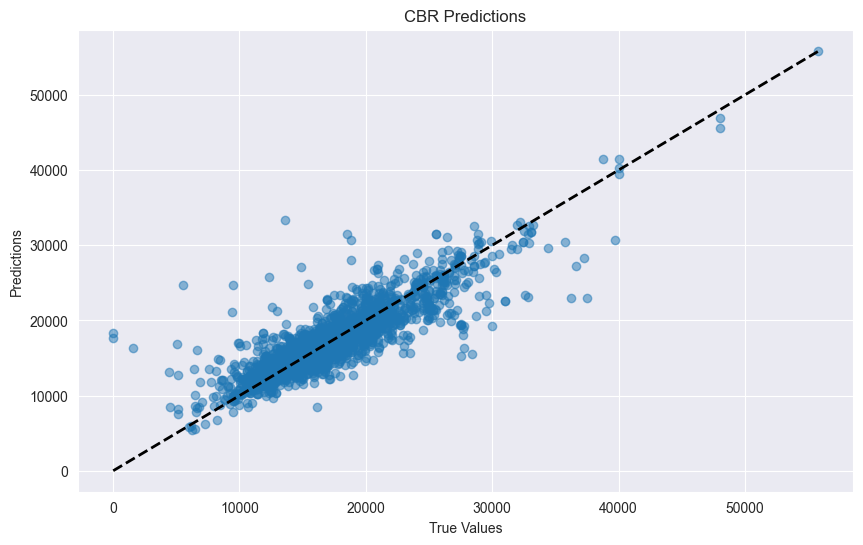

In [61]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

results_df = pd.DataFrame(columns=['Model', 'MAE', 'RMSE', 'R2', 'Measure_10%', 'Measure_20%'])

model_predictions_dict = {}

for model_name, model in trained_models.items():
    if isinstance(model, str):
        print(f"Error: {model_name} is not a trained model but a string: {model}")
        continue

    model_predictions = model.predict(X_test)
    model_predictions_dict[model_name] = model_predictions
    mae = mean_absolute_error(y_test, model_predictions)
    rmse = sqrt(mean_squared_error(y_test, model_predictions))
    r2 = r2_score(y_test, model_predictions)
    measure_10 = calculate_percentage_measure(y_test, model_predictions, 10)
    measure_20 = calculate_percentage_measure(y_test, model_predictions, 20)

    new_row = pd.DataFrame({
        'Model': [model_name],
        'MAE': [mae],
        'RMSE': [rmse],
        'R2': [r2],
        'Measure_10%': [measure_10],
        'Measure_20%': [measure_20]
    })

    results_df = pd.concat([results_df, new_row], ignore_index=True)

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, model_predictions, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
    plt.xlabel('True Values')
    plt.ylabel('Predictions')
    plt.title(f'{model_name} Predictions')
    plt.savefig(f'{model_name}_predictions.png')
    plt.show()

results_df.to_csv('model_results.csv', index=False)

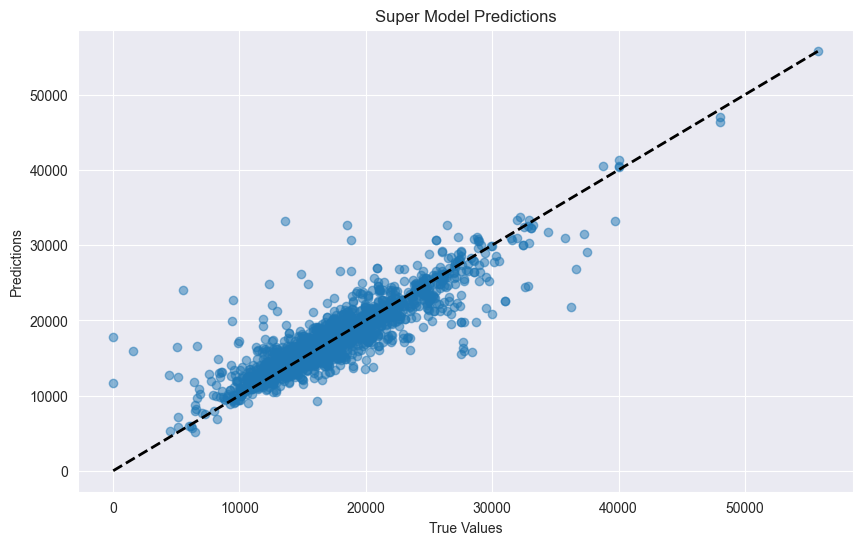

In [62]:
# super-model
gb_models = ['GBM', 'LGB', 'XGB', 'CBR']
predictions_list = []

for gb_model in gb_models:
    if gb_model in trained_models:
        predictions_list.append(trained_models[gb_model].predict(X_test))

# liczenie średniej z predykcji
super_model_predictions = sum(predictions_list) / len(predictions_list)
model_predictions_dict['Super-GB'] = super_model_predictions

mae = mean_absolute_error(y_test, super_model_predictions)
rmse = sqrt(mean_squared_error(y_test, super_model_predictions))
r2 = r2_score(y_test, super_model_predictions)
measure_10 = calculate_percentage_measure(y_test, super_model_predictions, 10)
measure_20 = calculate_percentage_measure(y_test, super_model_predictions, 20)

new_row = pd.DataFrame({
    'Model': ['Super Model (Average of GBM, LGB, XGB, CBR)'],
    'MAE': [mae],
    'RMSE': [rmse],
    'R2': [r2],
    'Measure_10%': [measure_10],
    'Measure_20%': [measure_20]
})

results_df = pd.concat([results_df, new_row], ignore_index=True)

plt.figure(figsize=(10, 6))
plt.scatter(y_test, super_model_predictions, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.title('Super Model Predictions')
plt.savefig('Super_Model_predictions.png')
plt.show()

results_df.to_csv('model_results.csv', index=False)

## Tworzenie histogramów błędów względnych

In [42]:
# Obliczanie błędów względnych
def calculate_relative_error(y_true, y_pred):
    return (y_pred - y_true) / y_true * 100

relative_errors = {}
for model_name, model in trained_models.items():
    model_predictions = model.predict(X_test)
    rel_error = calculate_relative_error(y_test, model_predictions)
    relative_errors[model_name] = rel_error
    
super_model_rel_error = calculate_relative_error(y_test, super_model_predictions)
relative_errors['Super-GB Model'] = super_model_rel_error


In [43]:
model_order = [
    'LR', 
    'DT', 
    'RF', 
    'CBR', 
    'GBM',
    'LGB', 
    'XGB', 
    'Super-GB Model'
]

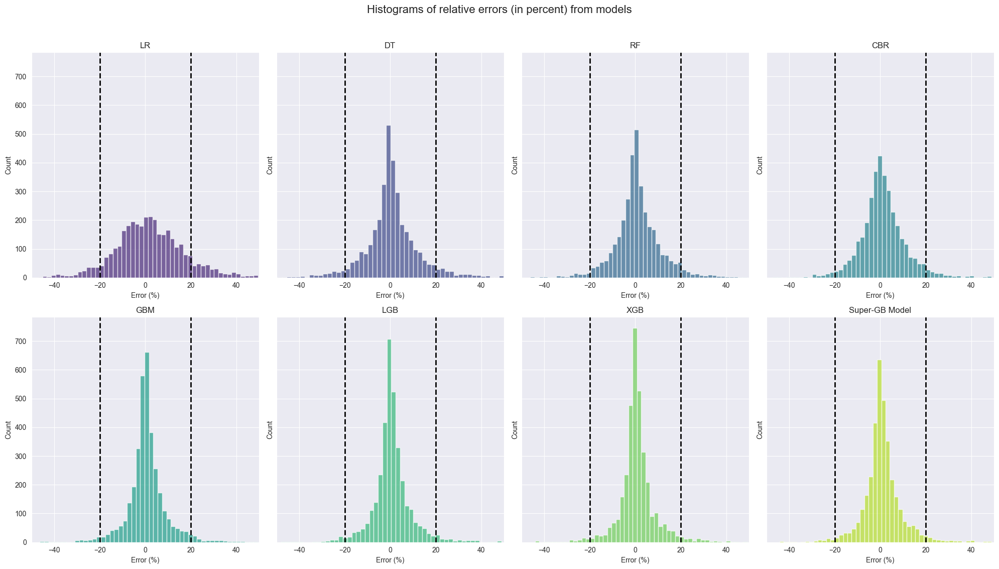

In [44]:
import seaborn as sns

fig, axes = plt.subplots(2, 4, figsize=(20, 12), sharey=True)
colors = sns.color_palette("viridis", len(model_order))

for ax, model_name, color in zip(axes.flatten(), model_order, colors):
    errors = relative_errors[model_name]
    errors = errors[np.abs(errors) < 50]
    ax.hist(errors, bins=50, alpha=0.7, color=color)
    ax.axvline(x=20, color='k', linestyle='--', linewidth=2)
    ax.axvline(x=-20, color='k', linestyle='--', linewidth=2)
    ax.set_title(model_name)
    ax.set_xlim([-50, 50])

for ax in axes[0, :]:
    ax.set_xlabel('Error (%)')
    ax.set_ylabel('Count')

for ax in axes[1, :]:
    ax.set_xlabel('Error (%)')
    ax.set_ylabel('Count')

fig.suptitle('Histograms of relative errors (in percent) from models', fontsize=16)


plt.tight_layout(rect=[0, 0.04, 1, 0.96])
plt.savefig('rel_errors.png')
plt.show()

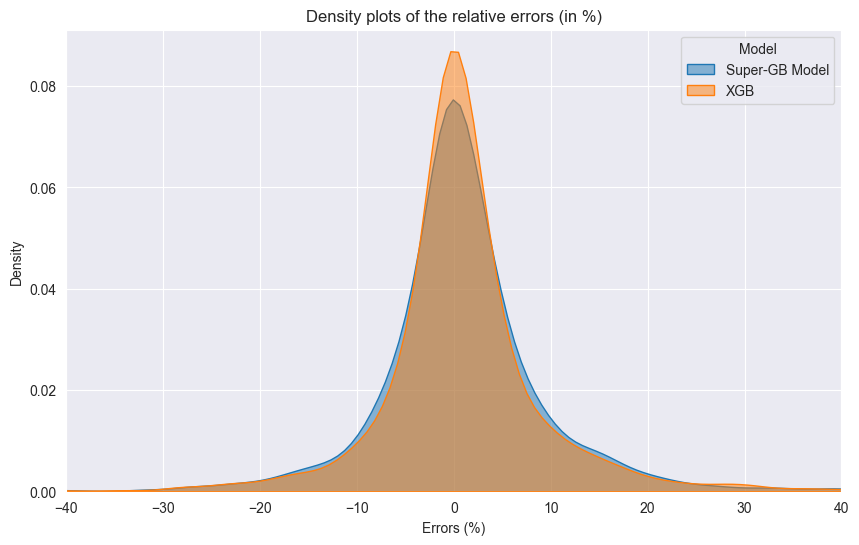

In [45]:
selected_models = ['Super-GB Model', 'XGB']
relative_errors_df = pd.DataFrame({model: relative_errors[model] for model in selected_models})

relative_errors_df = relative_errors_df[(relative_errors_df['Super-GB Model'].abs() <= 100) & (relative_errors_df['XGB'].abs() <= 100)]

data_long = relative_errors_df.melt(var_name='Model', value_name='Errors (%)')

plt.figure(figsize=(10, 6))

sns.kdeplot(data=data_long[data_long['Model'] == 'Super-GB Model'], x='Errors (%)', fill=True, common_norm=False, alpha=0.5, label='Super-GB Model')
sns.kdeplot(data=data_long[data_long['Model'] == 'XGB'], x='Errors (%)', fill=True, common_norm=False, alpha=0.5, label='XGB')

plt.legend(title='Model')

plt.title('Density plots of the relative errors (in %)')
plt.xlabel('Errors (%)')
plt.ylabel('Density')
plt.xlim(-40, 40)  # Ogranicz zakres osi x
plt.savefig('density_rel_error.png')
plt.show()

## Mieszanie modeli

In [46]:
xgb_predictions = trained_models['XGB'].predict(X_test)
cbr_predictions = trained_models['CBR'].predict(X_test)
lgb_predictions = trained_models['LGB'].predict(X_test)
gbm_predictions = trained_models['GBM'].predict(X_test)

In [47]:
a_values = np.linspace(0, 1, 200)

results_10_mean = []
results_10_min = []
results_10_max = []
results_20_mean = []
results_20_min = []
results_20_max = []

# symulacje
for a in a_values:
    combined_pred = a * xgb_predictions + (1 - a) * super_model_predictions
    
    # Obliczenia dla 10% i 20% measure - coś to nie liczy wartości odstających
    measure_10_sim = calculate_percentage_measure(y_test, combined_pred, 10)
    measure_20_sim = calculate_percentage_measure(y_test, combined_pred, 20)
    
    results_10_mean.append(np.mean(measure_10_sim))
    results_10_min.append(np.min(measure_10_sim))
    results_10_max.append(np.max(measure_10_sim))
    
    results_20_mean.append(np.mean(measure_20_sim))
    results_20_min.append(np.min(measure_20_sim))
    results_20_max.append(np.max(measure_20_sim))

measure_results_df = pd.DataFrame({
    'a': a_values,
    '10pct_measure': results_10_mean,
    '20pct_measure': results_20_mean,
    '10pct_measure_min': results_10_min,
    '10pct_measure_max': results_10_max,
    '20pct_measure_min': results_20_min,
    '20pct_measure_max': results_20_max
})

# Zapisanie wyników do pliku CSV (opcjonalne)
measure_results_df.to_csv('percentage_measures.csv', index=False)

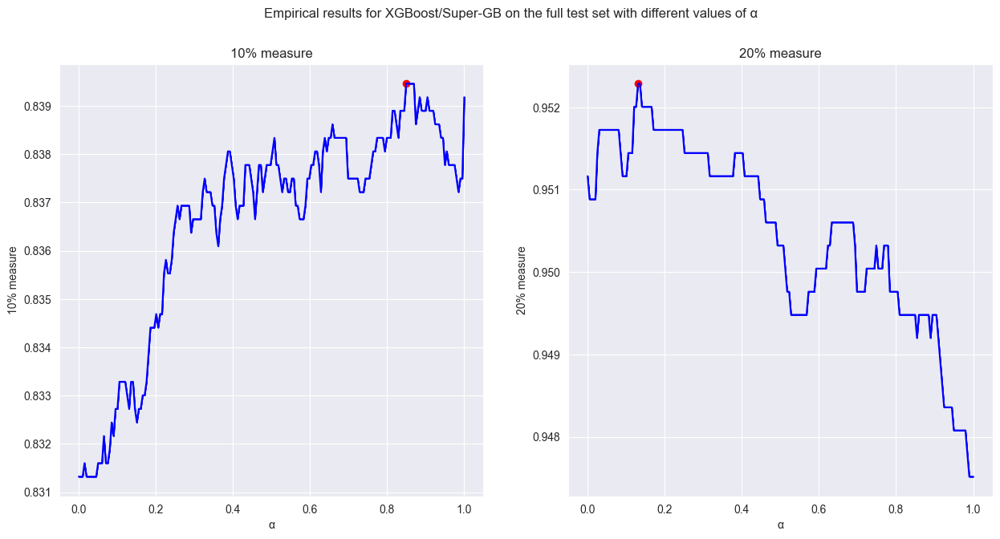

In [48]:
# optymalne wartości alfa dla 10% i 20% measure
optimal_alpha_10pct = measure_results_df.loc[measure_results_df['10pct_measure'].idxmax(), 'a']
optimal_value_10pct = measure_results_df['10pct_measure'].max()

optimal_alpha_20pct = measure_results_df.loc[measure_results_df['20pct_measure'].idxmax(), 'a']
optimal_value_20pct = measure_results_df['20pct_measure'].max()

fig, axs = plt.subplots(1, 2, figsize=(15, 7))

# Wykres dla wskaznika 10%
axs[0].plot(measure_results_df['a'], measure_results_df['10pct_measure'], 'b-', label='10% measure')
axs[0].fill_between(measure_results_df['a'], measure_results_df['10pct_measure_min'], measure_results_df['10pct_measure_max'], color='blue', alpha=0.9)
axs[0].scatter([optimal_alpha_10pct], [optimal_value_10pct], color='red')  # Dynamiczne oznaczenie optymalnego alpha
axs[0].set_title('10% measure')
axs[0].set_xlabel(f'α')
axs[0].set_ylabel('10% measure')

# Wykres dla wskazinika 20%
axs[1].plot(measure_results_df['a'], measure_results_df['20pct_measure'], 'b-', label='20% measure')
axs[1].fill_between(measure_results_df['a'], measure_results_df['20pct_measure_min'], measure_results_df['20pct_measure_max'], color='blue', alpha=0.9)
axs[1].scatter([optimal_alpha_20pct], [optimal_value_20pct], color='red')  # Dynamiczne oznaczenie optymalnego alpha
axs[1].set_title('20% measure')
axs[1].set_xlabel(f'α')
axs[1].set_ylabel('20% measure')

plt.suptitle('Empirical results for XGBoost/Super-GB on the full test set with different values of α')
plt.savefig('model_combination.png')
plt.show()


In [49]:
results_mae = []
results_rmse = []
results_r2 = []

# symulacje dla różnych wartości a
for a in a_values:
    combined_pred = a * xgb_predictions + (1 - a) * lgb_predictions
    
    mae = mean_absolute_error(y_test, combined_pred)
    rmse = root_mean_squared_error(y_test, combined_pred)
    r2 = r2_score(y_test, combined_pred)
    
    results_mae.append(mae)
    results_rmse.append(rmse)
    results_r2.append(r2)

measure_results_df = pd.DataFrame({
    'a': a_values,
    'MAE': results_mae,
    'RMSE': results_rmse,
    'R2': results_r2
})

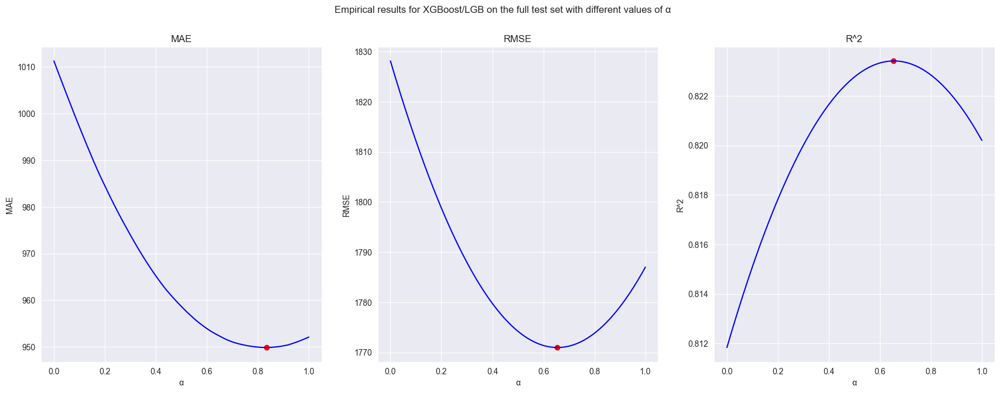

In [50]:
# Znajdź optymalne wartości alfa dla każdej metryki
optimal_alpha_mae = measure_results_df.loc[measure_results_df['MAE'].idxmin(), 'a']
optimal_value_mae = measure_results_df['MAE'].min()

optimal_alpha_rmse = measure_results_df.loc[measure_results_df['RMSE'].idxmin(), 'a']
optimal_value_rmse = measure_results_df['RMSE'].min()

optimal_alpha_r2 = measure_results_df.loc[measure_results_df['R2'].idxmax(), 'a']
optimal_value_r2 = measure_results_df['R2'].max()

fig, axs = plt.subplots(1, 3, figsize=(21, 7))

# Wykres dla MAE
axs[0].plot(measure_results_df['a'], measure_results_df['MAE'], 'b-', label='MAE')
axs[0].scatter([optimal_alpha_mae], [optimal_value_mae], color='red')  # Dynamiczne oznaczenie optymalnego alpha
axs[0].set_title('MAE')
axs[0].set_xlabel('α')
axs[0].set_ylabel('MAE')

# Wykres dla RMSE
axs[1].plot(measure_results_df['a'], measure_results_df['RMSE'], 'b-', label='RMSE')
axs[1].scatter([optimal_alpha_rmse], [optimal_value_rmse], color='red')  # Dynamiczne oznaczenie optymalnego alpha
axs[1].set_title('RMSE')
axs[1].set_xlabel('α')
axs[1].set_ylabel('RMSE')

# Wykres dla R^2
axs[2].plot(measure_results_df['a'], measure_results_df['R2'], 'b-', label='R^2')
axs[2].scatter([optimal_alpha_r2], [optimal_value_r2], color='red')  # Dynamiczne oznaczenie optymalnego alpha
axs[2].set_title('R^2')
axs[2].set_xlabel('α')
axs[2].set_ylabel('R^2')

plt.suptitle('Empirical results for XGBoost/LGB on the full test set with different values of α')
plt.savefig('model_combination_standard.png')
plt.show()


In [51]:
from itertools import product

def combined_predictions(weights, predictions_list):
    return sum(w * p for w, p in zip(weights, predictions_list))

def calculate_r2_for_weights(weights, y_test, predictions_list):
    combined_pred = combined_predictions(weights, predictions_list)
    return r2_score(y_test, combined_pred)


In [52]:
predictions_list = [xgb_predictions, lgb_predictions, gbm_predictions]

weight_range = np.linspace(0, 1, 200)
combinations = list(product(weight_range, repeat=3))
combinations = [combo for combo in combinations if sum(combo) == 1]

r2_scores = [calculate_r2_for_weights(weights, y_test, predictions_list) for weights in combinations]


best_idx = np.argmax(r2_scores)
best_weights = combinations[best_idx]
best_r2 = r2_scores[best_idx]


print("Best Weights:", best_weights)
print("Best R^2:", best_r2)


Best Weights: (0.5879396984924623, 0.2613065326633166, 0.15075376884422112)
Best R^2: 0.8241765763569133


In [63]:
weighted_super_gb_predictions = combined_predictions(best_weights, predictions_list)
model_predictions_dict['Weighted Super-GB'] = weighted_super_gb_predictions
weighted_super_gb_r2 = r2_score(y_test, weighted_super_gb_predictions)

print("R^2 for Weighted Super-GB:", weighted_super_gb_r2)



R^2 for Weighted Super-GB: 0.8162007824050146


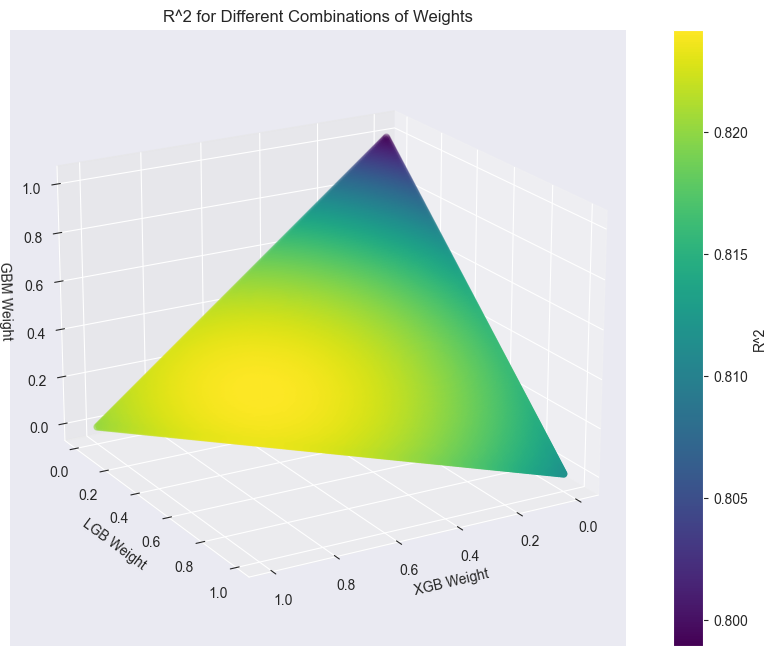

In [54]:
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

x = [w[0] for w in combinations]
y = [w[1] for w in combinations]
z = [w[2] for w in combinations]
c = r2_scores

img = ax.scatter(x, y, z, c=c, cmap='viridis')
ax.set_xlabel('XGB Weight')
ax.set_ylabel('LGB Weight')
ax.set_zlabel('GBM Weight')
fig.colorbar(img, label='R^2')

ax.set_title('R^2 for Different Combinations of Weights')


ax.view_init(elev=20, azim=60)


plt.savefig('R2_weighted_combinations.png')
plt.show()

In [55]:
import plotly.graph_objects as go

x = [w[0] for w in combinations]
y = [w[1] for w in combinations]
z = [w[2] for w in combinations]
c = r2_scores

fig = go.Figure(data=[go.Scatter3d(
    x=x,
    y=y,
    z=z,
    mode='markers',
    marker=dict(
        size=5,
        color=c,
        colorscale='Viridis',
        colorbar=dict(title='R^2')
    )
)])

fig.update_layout(
    title='R^2 for Different Combinations of Weights',
    scene=dict(
        xaxis_title='XGB Weight',
        yaxis_title='LGB Weight',
        zaxis_title='GBM Weight'
    )
)

fig.show()


In [56]:
# Obliczanie metryk dla "Weighted Super-GB"
mae_weighted = mean_absolute_error(y_test, weighted_super_gb_predictions)
rmse_weighted = root_mean_squared_error(y_test, weighted_super_gb_predictions)
r2_weighted = r2_score(y_test, weighted_super_gb_predictions)
measure_10_weighted = calculate_percentage_measure(y_test, weighted_super_gb_predictions, 10)
measure_20_weighted = calculate_percentage_measure(y_test, weighted_super_gb_predictions, 20)


In [57]:
# Tworzenie nowego wiersza z wynikami dla "Weighted Super-GB"
new_row_weighted = pd.DataFrame({
    'Model': ['Weighted Super-GB (Optimized Weights of XGB, LGB, GBM)'],
    'MAE': [mae_weighted],
    'RMSE': [rmse_weighted],
    'R2': [r2_weighted],
    'Measure_10%': [measure_10_weighted],
    'Measure_20%': [measure_20_weighted]
})

results_df = pd.concat([results_df, new_row_weighted], ignore_index=True)
results_df.to_csv('model_results.csv', index=False)

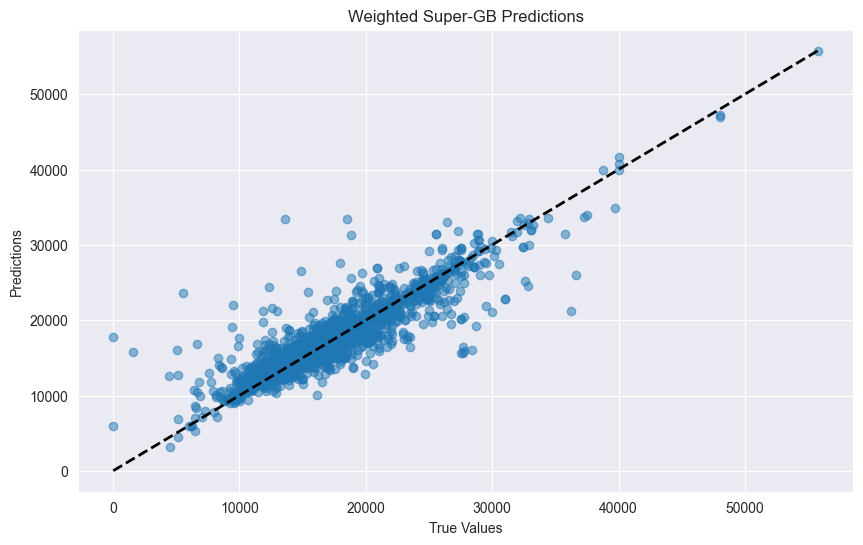

In [58]:
# Tworzenie wykresu dla "Weighted Super-GB"
plt.figure(figsize=(10, 6))
plt.scatter(y_test, weighted_super_gb_predictions, alpha=0.5)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel('True Values')
plt.ylabel('Predictions')
plt.title('Weighted Super-GB Predictions')
plt.savefig('Weighted_Super_GB_predictions.png')
plt.show()


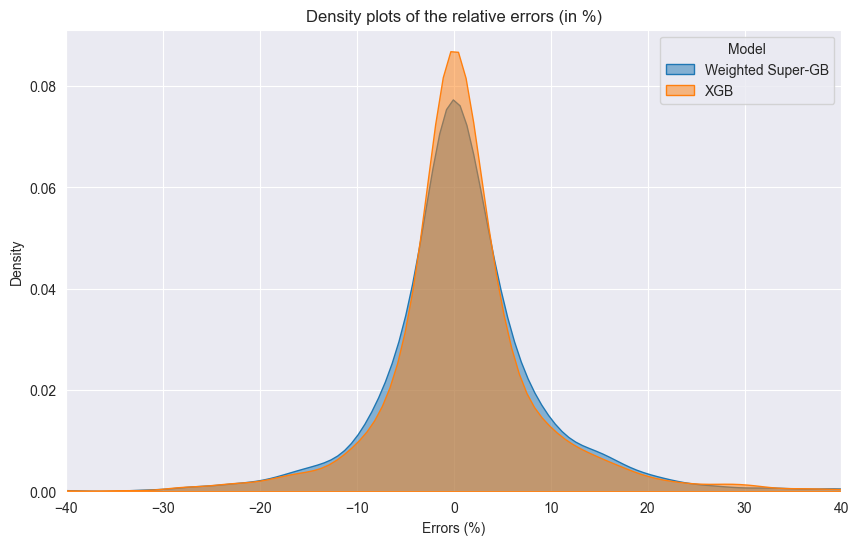

In [59]:
super_weighted_model_rel_error = calculate_relative_error(y_test, super_model_predictions)
relative_errors['Weighted Super-GB'] = super_weighted_model_rel_error

selected_models = ['Weighted Super-GB', 'XGB']
relative_errors_df = pd.DataFrame({model: relative_errors[model] for model in selected_models})

relative_errors_df = relative_errors_df[(relative_errors_df['Weighted Super-GB'].abs() <= 100) & (relative_errors_df['XGB'].abs() <= 100)]

data_long = relative_errors_df.melt(var_name='Model', value_name='Errors (%)')

plt.figure(figsize=(10, 6))

sns.kdeplot(data=data_long[data_long['Model'] == 'Weighted Super-GB'], x='Errors (%)', fill=True, common_norm=False, alpha=0.5, label='Weighted Super-GB')
sns.kdeplot(data=data_long[data_long['Model'] == 'XGB'], x='Errors (%)', fill=True, common_norm=False, alpha=0.5, label='XGB')

plt.legend(title='Model')

plt.title('Density plots of the relative errors (in %)')
plt.xlabel('Errors (%)')
plt.ylabel('Density')
plt.xlim(-40, 40)
plt.savefig('density_weighted_rel_error.png')
plt.show()

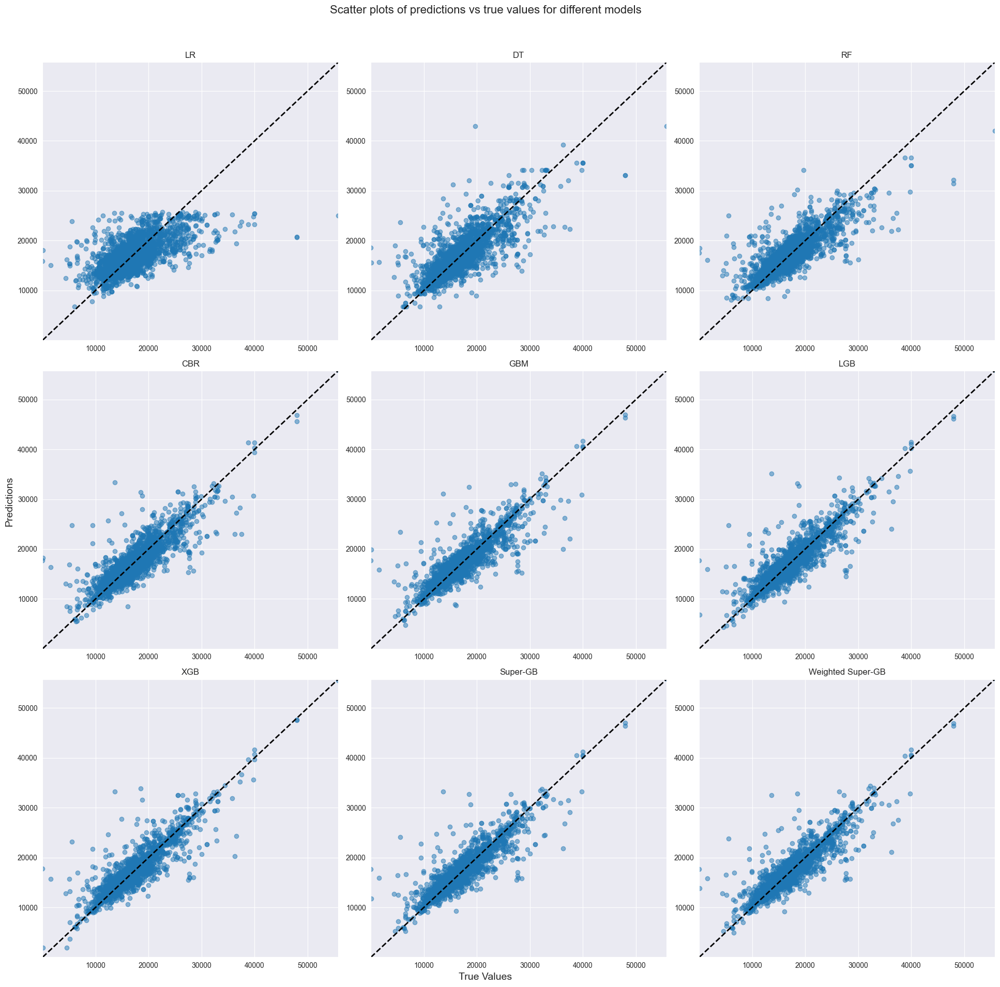

In [66]:
# Tworzenie siatki wykresów 3x3
fig, axes = plt.subplots(3, 3, figsize=(20, 20))
axes = axes.flatten()
model_order = [
    'LR', 
    'DT', 
    'RF', 
    'CBR', 
    'GBM',
    'LGB', 
    'XGB', 
    'Super-GB', 
    'Weighted Super-GB'
]

# Plotowanie wykresów w siatce
for ax, model_name in zip(axes, model_order):
    if model_name in model_predictions_dict:
        model_predictions = model_predictions_dict[model_name]
        ax.scatter(y_test, model_predictions, alpha=0.5)
        ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
        ax.set_title(model_name)
        ax.set_xlim([y_test.min(), y_test.max()])
        ax.set_ylim([y_test.min(), y_test.max()])

# Dodanie wspólnych etykiet osi
fig.text(0.5, 0.04, 'True Values', ha='center', va='center', fontsize=14)
fig.text(0.04, 0.5, 'Predictions', ha='center', va='center', rotation='vertical', fontsize=14)
fig.suptitle('Scatter plots of predictions vs true values for different models', fontsize=16)

# Usuwanie pustych osi
for i in range(len(model_order), len(axes)):
    fig.delaxes(axes[i])

# Zapisanie wykresu jako plik PNG
plt.tight_layout(rect=[0.04, 0.04, 1, 0.96])
plt.savefig('combined_model_predictions.png')
plt.show()